In [1]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage

# for everything else
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import plotly.express as px
from random import randint
import pandas as pd
import pickle
import time
plt.style.use('ggplot')

![vgg](vgg.png)

In [2]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [3]:
def load_image(path):
    image_list = np.zeros((len(os.listdir(path)), 224, 224, 3))
    for i, fig in enumerate(os.listdir(path)):
        img = load_img(os.path.join(path,fig), target_size=(224,224))
        x = img_to_array(img).astype('float32')
        x = x / 255.0
        image_list[i] = x
    
    return image_list

In [4]:
gloms = []

In [5]:
with os.scandir("./gloms_cropped/test") as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.png'):
          # adds only the image files to the flowers list
            gloms.append(file.name)

In [6]:
len(gloms)

560

In [7]:
data = {}

In [8]:
for glom in gloms:
    # try to extract the features and update the dictionary
    feat = extract_features("./gloms_cropped/test/"+glom,model)
    data[glom] = feat

In [9]:
filenames = np.array(list(data.keys()))

In [10]:
feat = np.array(list(data.values()))

In [11]:
feat.shape

(560, 1, 4096)

In [12]:
feat = feat.reshape(-1,4096)

In [13]:
feat.shape

(560, 4096)

In [14]:
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components=100, random_state=42)
pca.fit(feat)
x = pca.transform(feat)

In [15]:
print('Cumulative explained variation for 100 principal components: {}'.format(sum(pca.explained_variance_ratio_)))

Cumulative explained variation for 100 principal components: 0.9259343175217509


In [16]:
x.shape

(560, 100)

###  T-SNE

In [17]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=5000, random_state = 42)
tsne_results = tsne.fit_transform(x)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 560 samples in 0.000s...
[t-SNE] Computed neighbors for 560 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 560 / 560
[t-SNE] Mean sigma: 19.521706
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.087990
[t-SNE] KL divergence after 1450 iterations: 0.670056
t-SNE done! Time elapsed: 4.366161823272705 seconds


In [18]:
tsne_results.shape

(560, 2)

<AxesSubplot:>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


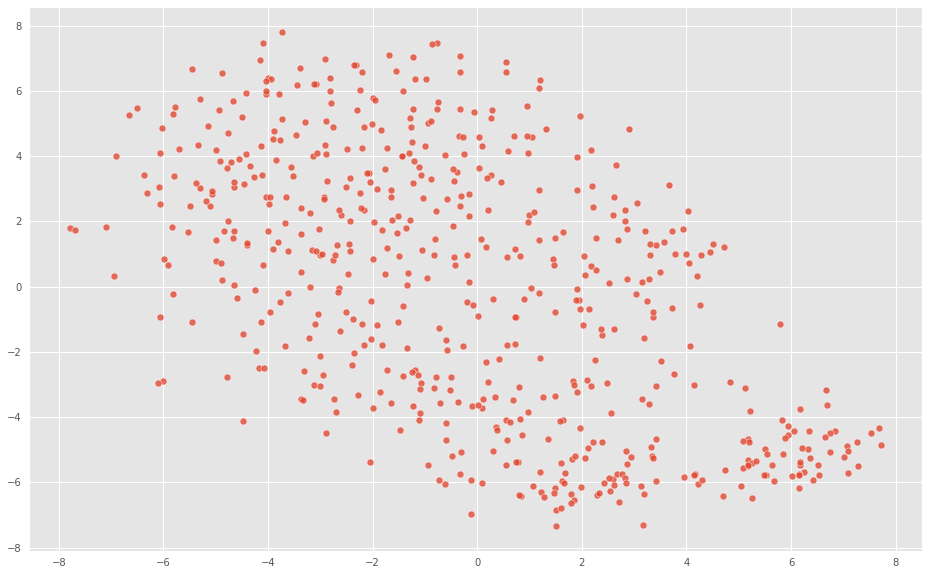

In [19]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x = tsne_results[:,0],
    y = tsne_results[:,1],
    legend="full",
    alpha=0.8
)

---

###  What is the optimal K?

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


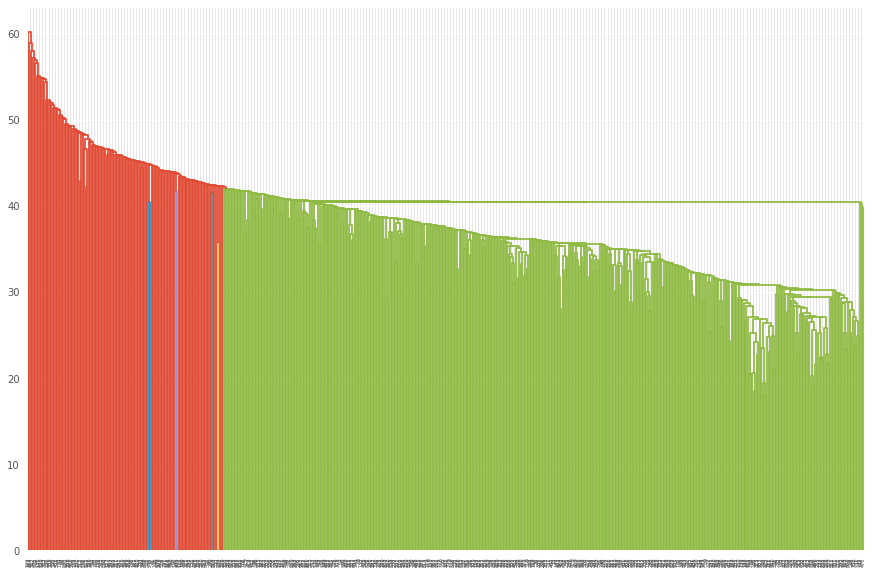

In [20]:
linked = linkage(x, 'single')

labelList = range(1, x.shape[0]+1)

plt.figure(figsize=(15, 10))
dendrogram(linked,
            orientation='top',
            labels=labelList,
            distance_sort='descending',
            show_leaf_counts=True)
plt.show()

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


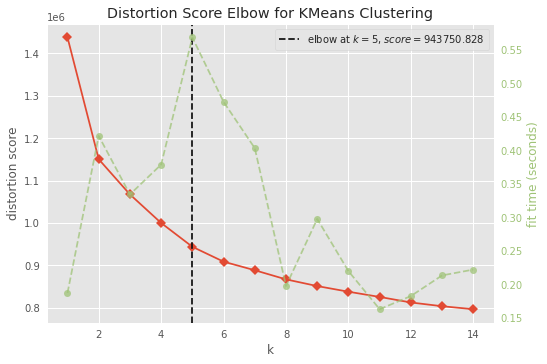

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [21]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,15))

visualizer.fit(x)        # Fit the data to the visualizer
visualizer.show() 

### K=5

In [22]:
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(x)

KMeans(n_clusters=5, random_state=42)

In [23]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [24]:
groups

{0: ['tile_1211.png',
  'tile_2907.png',
  'tile_267.png',
  'tile_2939.png',
  'tile_1623.png',
  'tile_1568.png',
  'tile_164.png',
  'tile_1642.png',
  'tile_2080.png',
  'tile_408.png',
  'tile_2282.png',
  'tile_2421.png',
  'tile_3254.png',
  'tile_2098.png',
  'tile_1327.png',
  'tile_1626.png',
  'tile_412.png',
  'tile_857.png',
  'tile_1931.png',
  'tile_402.png',
  'tile_1179.png',
  'tile_2214.png',
  'tile_1617.png',
  'tile_2073.png',
  'tile_2712.png',
  'tile_192.png',
  'tile_2977.png',
  'tile_2063.png',
  'tile_1293.png',
  'tile_340.png',
  'tile_1335.png',
  'tile_83.png',
  'tile_970.png',
  'tile_2357.png',
  'tile_2021.png',
  'tile_1741.png',
  'tile_3297.png',
  'tile_467.png',
  'tile_1929.png',
  'tile_2536.png',
  'tile_1769.png',
  'tile_284.png',
  'tile_1475.png',
  'tile_2097.png',
  'tile_1190.png',
  'tile_3076.png',
  'tile_715.png',
  'tile_535.png',
  'tile_1156.png',
  'tile_271.png',
  'tile_3279.png',
  'tile_1559.png',
  'tile_251.png',
  'tile

In [25]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    plt.figure(figsize = (30,30));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 60:
        print(f"Clipping cluster size from {len(files)} to 60")
        files = files[:60]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(8,8,index+1);
        img = load_img("./gloms_cropped/test/"+file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

In [26]:
def compare_clusters(n_samples, clusters=[i for i in range(len(groups))]):
    if len(clusters)<2:
        print("At least 2 clusters should be compared.")
        return None
    
    fig, big_axes = plt.subplots(figsize = (4*n_samples,5*len(clusters)) , nrows=len(clusters), ncols=1, sharey=True) 
    
    for row, big_ax in enumerate(big_axes, start=1):
        big_ax.set_title(f"Cluster - {clusters[row-1]}", fontsize=16)
        # Turn off axis lines and ticks of the big subplot 
        # obs alpha is 0 in RGBA string!
        big_ax.tick_params(labelcolor=(1.,1.,1., 0.0), top='off', bottom='off', left='off', right='off')
        # removes the white frame
        big_ax._frameon = False
    
    imgs = []
    for i in clusters:
        files = random.sample(groups[i], n_samples)
        imgs +=files
    
    for index, file in enumerate(imgs):
        ax = fig.add_subplot(len(clusters),n_samples,index+1);
        img = load_img("./gloms_cropped/test/"+file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')
#     plt.tight_layout()

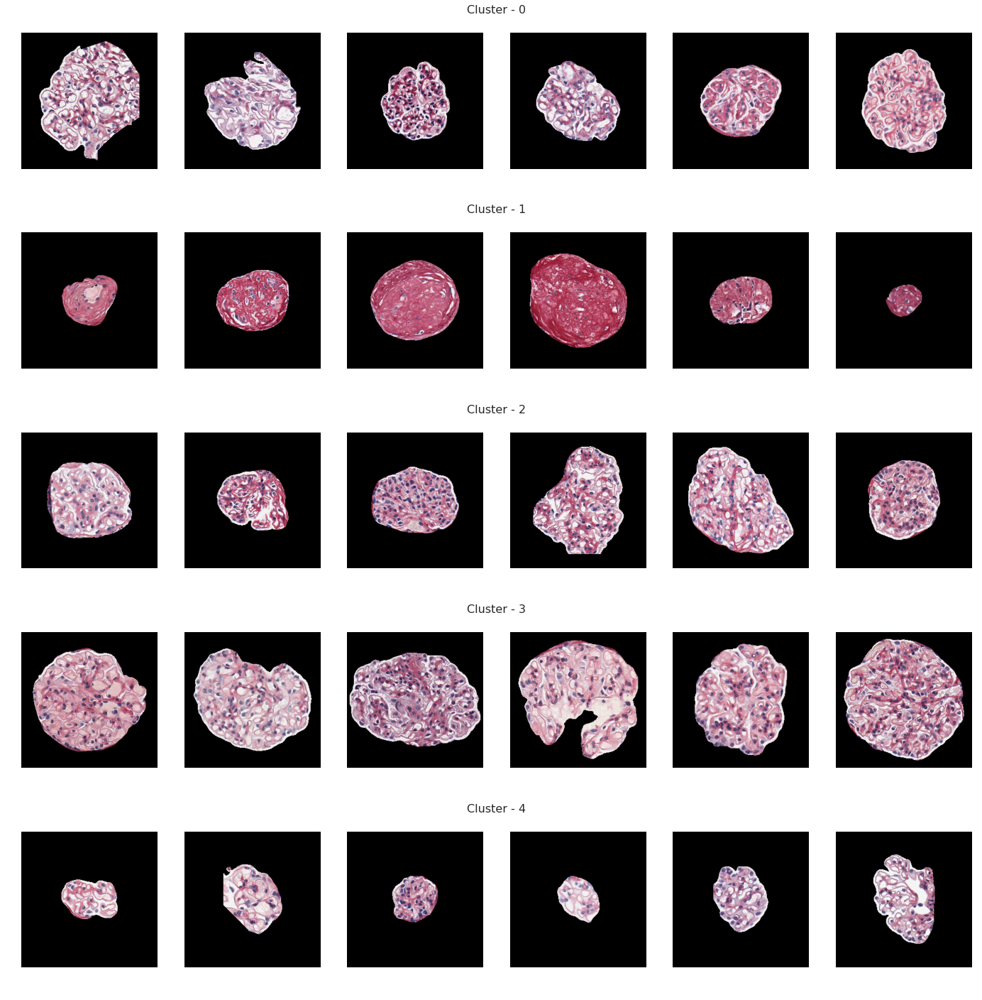

In [38]:
compare_clusters(n_samples=6)

Clipping cluster size from 139 to 60


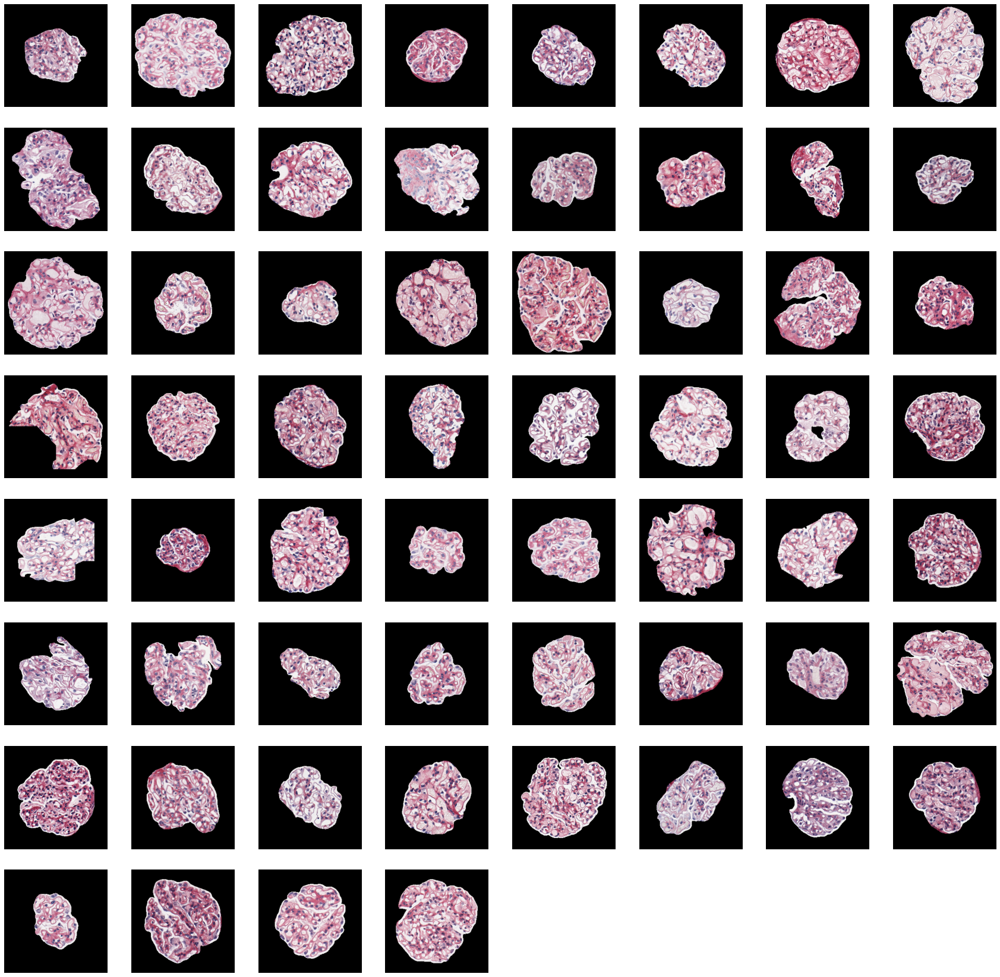

In [30]:
view_cluster(0)

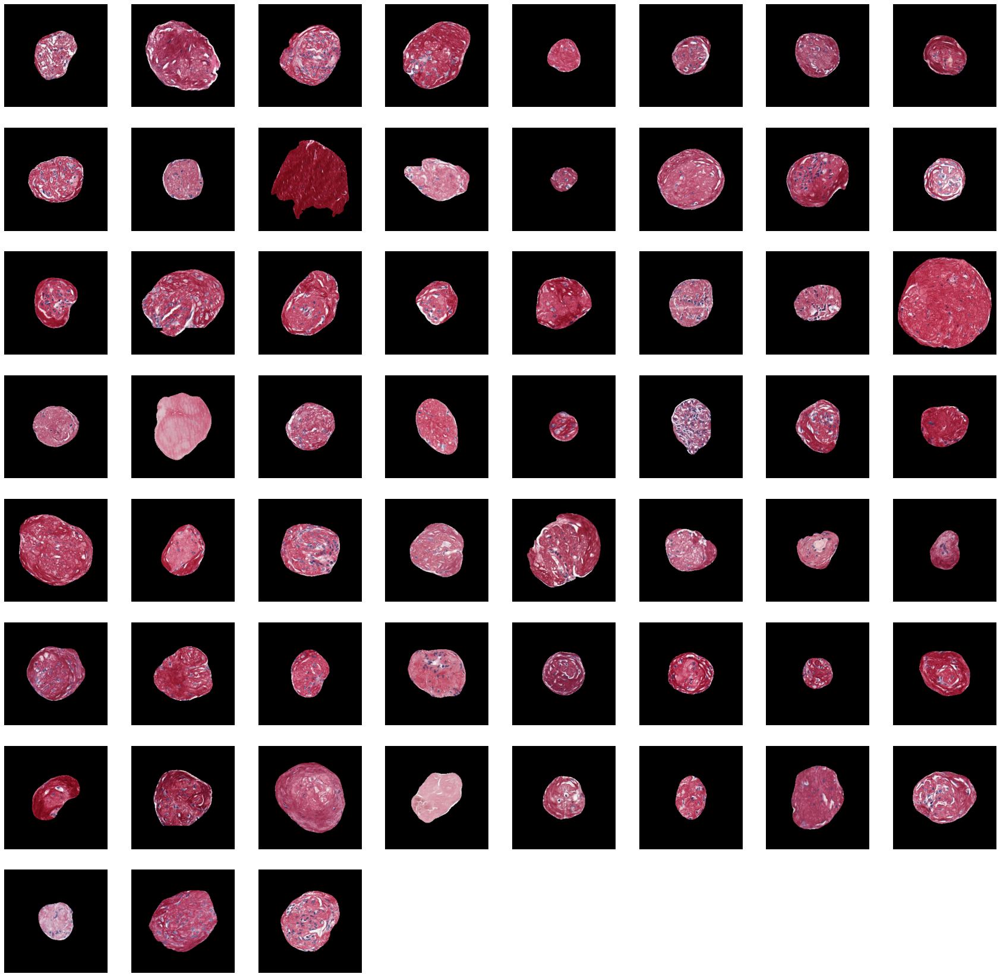

In [31]:
view_cluster(1)

Clipping cluster size from 88 to 60


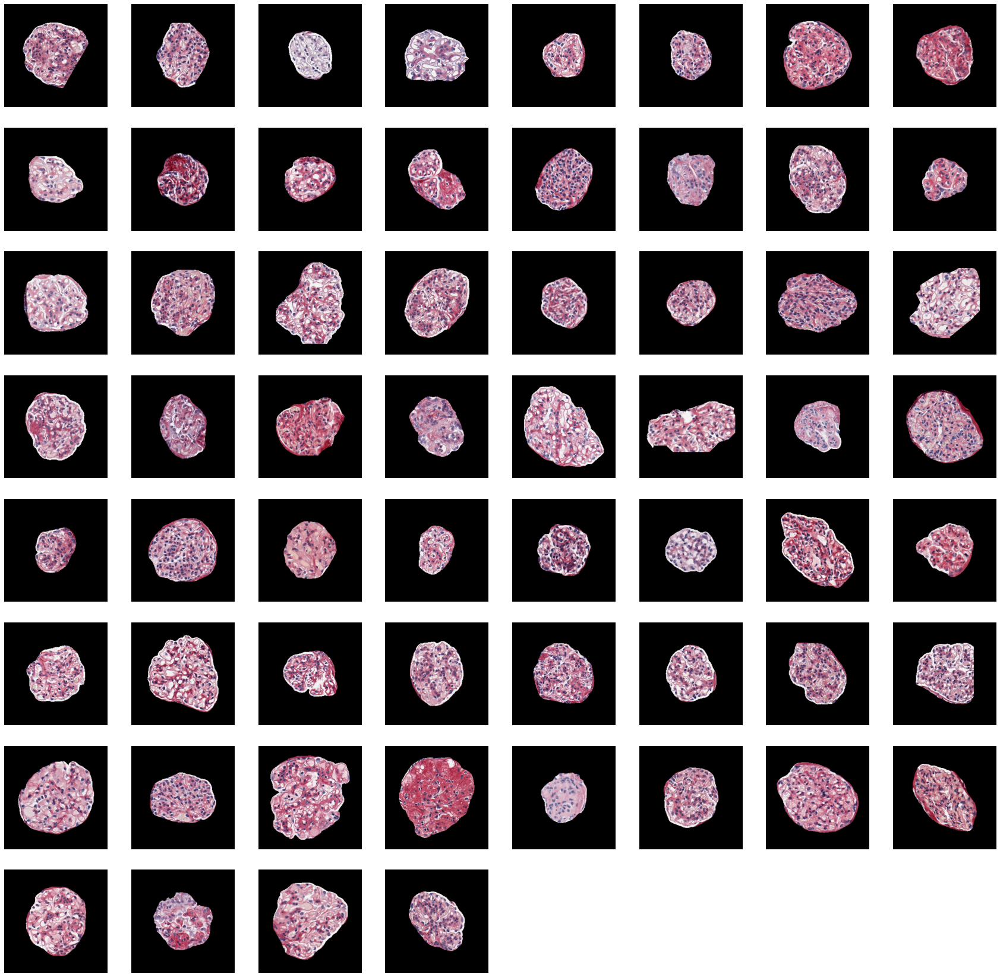

In [32]:
view_cluster(2)

Clipping cluster size from 175 to 60


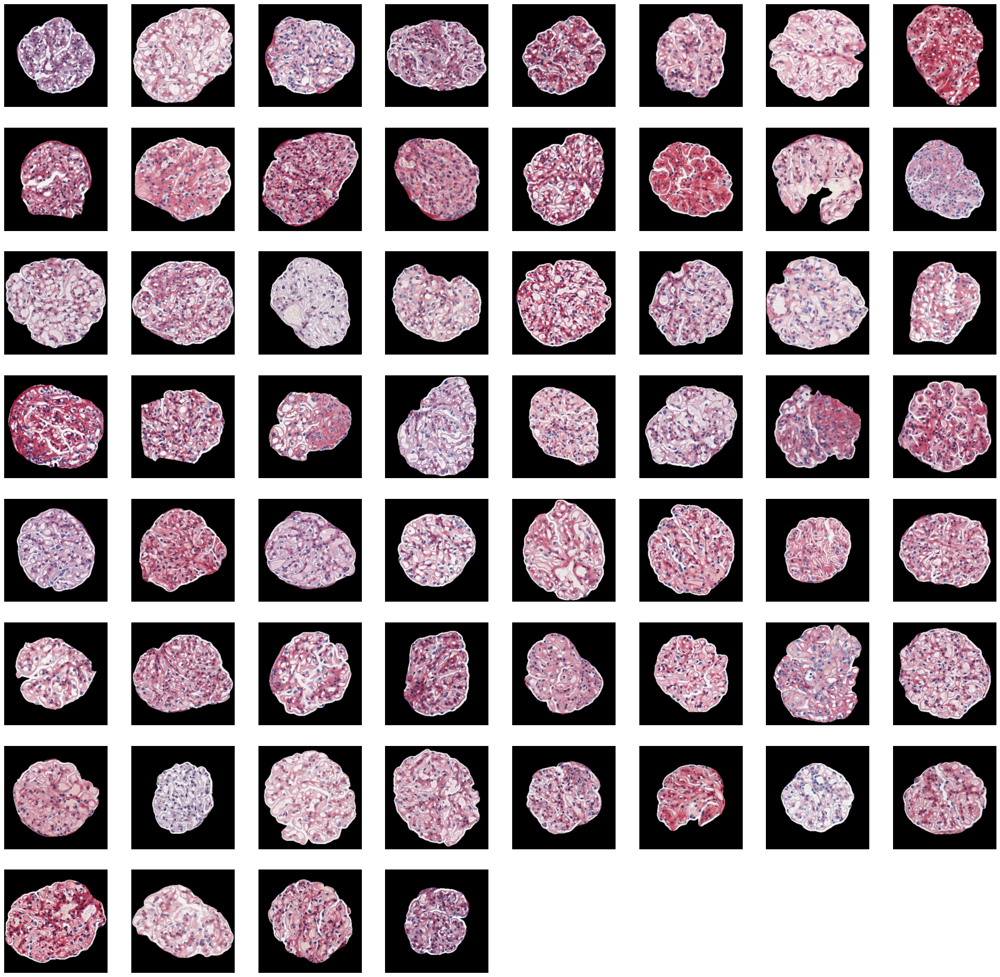

In [33]:
view_cluster(3)

Clipping cluster size from 99 to 60


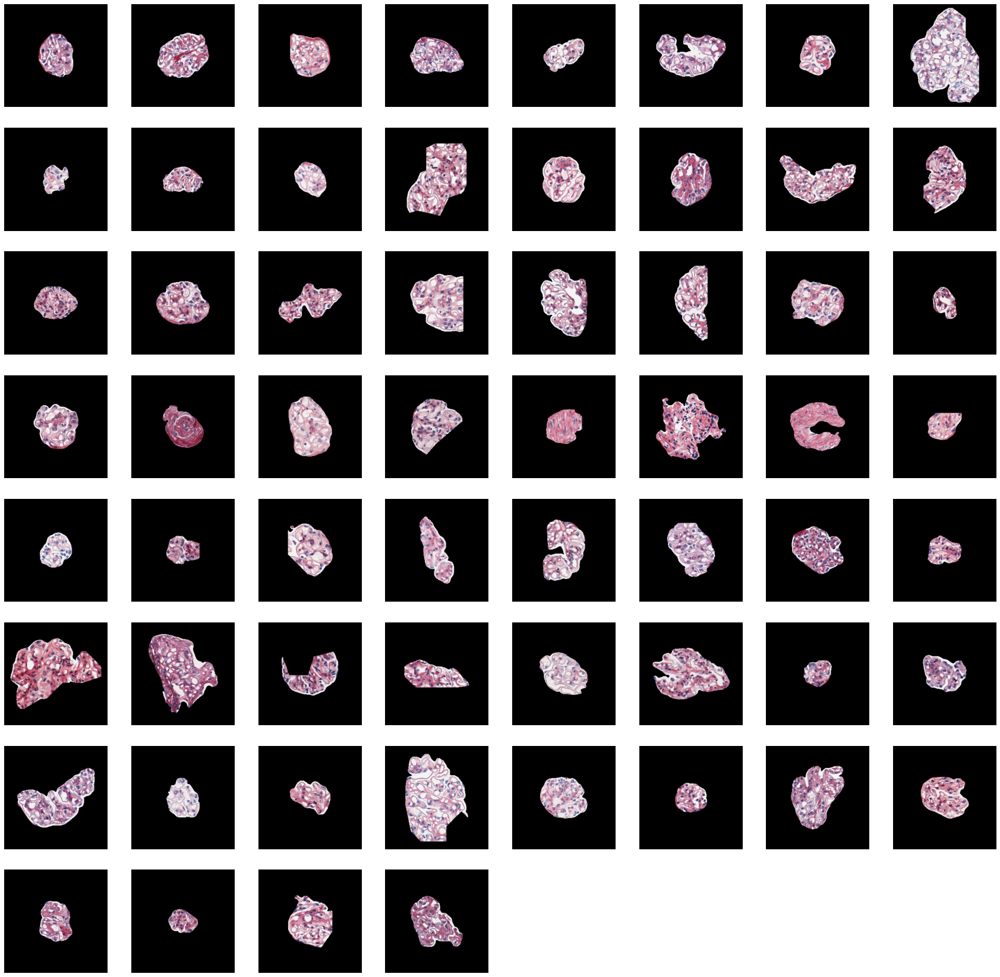

In [34]:
view_cluster(4)

In [33]:
for n_clusters in range(2,20):
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(x)
    centers = clusterer.cluster_centers_

    s_score = silhouette_score(x, preds)
    c_score = calinski_harabasz_score(x, preds)
    d_score = davies_bouldin_score (x, preds)
    print("For n_clusters = {}, silhouette score is {}, Calinski-Harabasz - {}, Davies-Bouldin - {})".format(n_clusters, s_score, c_score, d_score))

For n_clusters = 2, silhouette score is 0.177216038107872, Calinski-Harabasz - 139.332000343404, Davies-Bouldin - 1.933499872730966)
For n_clusters = 3, silhouette score is 0.14186960458755493, Calinski-Harabasz - 96.43826712945408, Davies-Bouldin - 2.070374572960922)
For n_clusters = 4, silhouette score is 0.12020695209503174, Calinski-Harabasz - 81.24046335232947, Davies-Bouldin - 2.082801149379447)
For n_clusters = 5, silhouette score is 0.11164064705371857, Calinski-Harabasz - 72.59427537348489, Davies-Bouldin - 2.2172900735536185)
For n_clusters = 6, silhouette score is 0.10793273895978928, Calinski-Harabasz - 64.47865069028336, Davies-Bouldin - 2.375604615387968)
For n_clusters = 7, silhouette score is 0.10132203996181488, Calinski-Harabasz - 57.172557168257576, Davies-Bouldin - 2.508196526405414)
For n_clusters = 8, silhouette score is 0.08638495951890945, Calinski-Harabasz - 51.96398165233683, Davies-Bouldin - 2.467042527171321)
For n_clusters = 9, silhouette score is 0.0915734

### Hierarchical clustering 

In [34]:
for n_clusters in range(2,20):
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')
    preds = clusterer.fit_predict(x)
#     centers = clusterer.cluster_centers_

    s_score = silhouette_score(x, preds)
    c_score = calinski_harabasz_score(x, preds)
    d_score = davies_bouldin_score (x, preds)
    print("For n_clusters = {}, silhouette score is {}, Calinski-Harabasz - {}, Davies-Bouldin - {})".format(n_clusters, s_score, c_score, d_score))

For n_clusters = 2, silhouette score is 0.16798248887062073, Calinski-Harabasz - 119.35829680099641, Davies-Bouldin - 1.8634824116438806)
For n_clusters = 3, silhouette score is 0.08520446717739105, Calinski-Harabasz - 82.50565356388053, Davies-Bouldin - 2.9987792477510147)
For n_clusters = 4, silhouette score is 0.08791963011026382, Calinski-Harabasz - 71.00931059367544, Davies-Bouldin - 2.620418238125781)
For n_clusters = 5, silhouette score is 0.09178879857063293, Calinski-Harabasz - 64.5258435282959, Davies-Bouldin - 2.3107992647526663)
For n_clusters = 6, silhouette score is 0.08560047298669815, Calinski-Harabasz - 57.11728044303952, Davies-Bouldin - 2.739255950516306)
For n_clusters = 7, silhouette score is 0.077193982899189, Calinski-Harabasz - 50.583257312157066, Davies-Bouldin - 2.700846691306086)
For n_clusters = 8, silhouette score is 0.07533010840415955, Calinski-Harabasz - 45.763395932167214, Davies-Bouldin - 2.7936529936146863)
For n_clusters = 9, silhouette score is 0.07

###  DBSCAN

In [35]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=5000, random_state = 42)
tsne_results = tsne.fit_transform(x)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 560 samples in 0.001s...
[t-SNE] Computed neighbors for 560 samples in 0.034s...
[t-SNE] Computed conditional probabilities for sample 560 / 560
[t-SNE] Mean sigma: 19.521706
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.087990
[t-SNE] KL divergence after 1450 iterations: 0.670056
t-SNE done! Time elapsed: 3.451728343963623 seconds


In [36]:
tsne_results.shape

(560, 2)

#####  Finding epsilon value

In [37]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(tsne_results)
distances, indices = nbrs.kneighbors(tsne_results)

In [38]:
distances, len(distances)

(array([[0.        , 0.49347979],
        [0.        , 0.26169208],
        [0.        , 0.25399318],
        ...,
        [0.        , 0.16344987],
        [0.        , 0.2036982 ],
        [0.        , 0.18962504]]),
 560)

In [39]:
indices, len(indices)

(array([[  0, 160],
        [  1,   7],
        [  2, 440],
        ...,
        [557, 135],
        [558, 260],
        [559, 495]]),
 560)

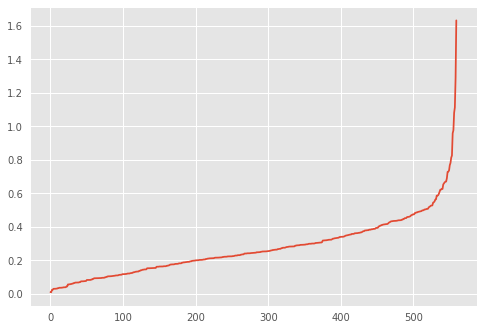

In [40]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

##### Clustering

In [400]:
dbs = DBSCAN(eps=0.5, min_samples=3)

In [401]:
dbs.fit(tsne_results)

DBSCAN(min_samples=3)

In [402]:
clusters = dbs.labels_
clusters, len(clusters)

(array([ 3,  0,  1,  1,  2,  0, -1,  0, -1, -1,  3,  0,  4,  0,  3, 21,  3,
         0,  0,  0,  0,  5,  5,  2,  2,  3, -1, 25,  6,  0,  7,  8,  0, -1,
         1,  9, -1,  0, 10, -1, 11, 12, 12, -1, -1,  2,  8, 13,  3,  3,  3,
         8,  3, 10, -1,  2, -1,  8, -1,  8,  7, 14, -1, -1,  3, 10, 12, 13,
         1, -1,  0, -1,  0,  0, 15,  1,  8, 16,  7,  1,  0,  8,  0, 12, 12,
         8,  0,  0, -1, 17, -1, -1, 12,  0,  7, -1,  3,  0,  6, 12,  8,  0,
         2, -1,  1,  0,  0, 18, 19, 20, -1, 10,  1,  3, 29, -1,  0,  3,  8,
        14, 12,  0,  2, -1, 12, -1,  0,  0, -1, -1,  0,  3,  8,  4,  8,  0,
         0, 12, 12, -1,  0, -1, 21, 22,  6,  2, 12, 12, 12,  0, 16,  0, -1,
         0,  2, -1, -1,  6, -1,  0,  3, 10,  6,  0,  8,  0, 12,  0,  0, 12,
        -1, 20,  0, -1,  8,  0,  0,  8,  8,  8,  5, 28, 12,  3, -1,  0,  9,
         4, 14, -1,  1,  3,  0,  7,  3,  0,  8, 15,  0, 16,  0,  0,  0,  0,
         2, 12,  0, -1,  0, 12, 17, -1,  0,  3,  8, -1, -1,  1,  7,  2, -1,
         2, 

In [403]:
colors = ['royalblue', 'maroon', 'forestgreen', 'mediumorchid', 'tan', 'deeppink', 'olive', 'goldenrod', 'lightcyan', 'navy']
vectorizer = np.vectorize(lambda x: colors[x % len(colors)])

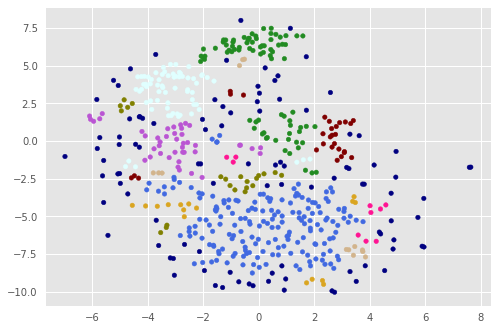

In [404]:
plt.scatter(tsne_results[:,0], tsne_results[:,1], c=vectorizer(clusters), s = 20)